In [51]:
import os
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
# from mdlearn.utils import plot_scatter
from typing import List, Dict, Optional

from Bio import SeqIO, SeqUtils, SeqRecord
from Bio.SeqUtils.IsoelectricPoint import IsoelectricPoint

os.environ["CUDA_VISIBLE_DEVICES"] = "2"

In [52]:
def plot_scatter(
    data: np.ndarray,
    color_dict: Dict[str, np.ndarray] = {},
    color: Optional[str] = None,
):

    import pandas as pd
    import plotly.express as px

    df_dict = color_dict.copy()

    dim = data.shape[1]
    assert dim in [2, 3]
    for i, name in zip(range(dim), ["x", "y", "z"]):
        df_dict[name] = data[:, i]

    df = pd.DataFrame(df_dict)
    scatter_kwargs = dict(
        x="x",
        y="y",
        color=color,
        width=1000,
        height=1000,
        size_max=7,
        hover_data=list(df_dict.keys()),
    )
    if dim == 2:
        fig = px.scatter(df, **scatter_kwargs)
    else:  # dim == 3
        fig = px.scatter_3d(df, z="z", **scatter_kwargs)
    return fig


In [3]:
# TODO:
# Convert DNA to RNA and predict RNA secondary structure (Important for mRNA translation into protien)
# If the RNA can form stable secondary structures, you can get metastable structures which makes in difficiult
# for the ribosome to read the RNA, which slows down translation.

# Can also look at DNA secondary structure

# Can look at secondary strcuture prediction of protein and then can align the secondary strcutures

# DNA melting point (strongly correlated with GC) stronger if more GC's are grouped together

# Color by stop codon

In [4]:
import matplotlib.pyplot as plt
def show_scatter(data: np.ndarray, color: np.ndarray):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_facecolor('white')
    ff = ax.scatter(data[:, 0], data[:, 1], data[:, 2], c=color)
    plt.colorbar(ff)
    plt.show()

In [5]:
ls /homes/mzvyagin/MDH/perlmutter_data/

globalstep2850.fasta           inference-test-embeddings.npy
gpt2_embeddings.tar.gz         inference-train-embeddings.npy
gpt2_generated_embeddings.npy  inference-val-embeddings.npy


In [6]:
#train_embed = np.load("")
val_embed = np.load("/homes/mzvyagin/MDH/gpt2_ecoli_bpe_fournode_2_test_and_val_embeddings/inference-val-embeddings.npy")
test_embed = np.load("/homes/mzvyagin/MDH/gpt2_ecoli_bpe_fournode_2_test_and_val_embeddings/inference-test-embeddings.npy")
# generated_embed = np.load("/homes/mzvyagin/MDH/perlmutter_data/gpt2_generated_embeddings.npy")

In [7]:
len(val_embed)

38664

In [8]:
# generated_embed.shape

In [9]:
val_embed.shape

(38664, 512, 768)

In [10]:
# Average residue dimension to get a single embedding per sequence
val_avg = val_embed.mean(axis=1)
test_avg = test_embed.mean(axis=1)
# generated_avg = generated_embed.mean(axis=1)

In [11]:
val_avg.shape

(38664, 768)

In [12]:
# load in the pickle files
import pickle

In [13]:
with open("/homes/mzvyagin/ecoli_single_contig_genomes/ecoli_fasta_bpe_tokenized/val.pkl", "rb") as f:
    val_samples = pickle.load(f)

In [14]:
with open("/homes/mzvyagin/ecoli_single_contig_genomes/ecoli_fasta_bpe_tokenized/test.pkl", "rb") as f:
    test_samples = pickle.load(f)

In [15]:
from transformers import PreTrainedTokenizerFast

In [16]:
tokenizer = PreTrainedTokenizerFast(tokenizer_file="/homes/mzvyagin/ecoli_single_contig_genomes/ecoli_fasta_bpe.json")

In [17]:
val_samples = val_samples[:len(val_embed)]
test_samples = test_samples[:len(test_embed)]

In [18]:
from tqdm import tqdm

In [34]:
val_ignore = []
val_decoded_without_ignored = []
val_embed_without_ignored = []
val_decoded_seqs = []
val_decoded_protein_seqs = []
for i in tqdm(range(len(val_samples))):
    decoded = tokenizer.decode(val_samples[i])
    decoded = "".join(decoded.split(" "))
    decoded_seq = Seq(decoded)
    try: 
        decoded_protein_seq = decoded_seq.translate()
        val_decoded_protein_seqs.append(decoded_protein_seq)
        val_decoded_seqs.append(decoded_seq)
        val_decoded_without_ignored.append("".join(decoded.split(" ")))
        val_embed_without_ignored.append(val_embed[i])
    except:
        val_ignore.append(i)
        
    # found_chars = Counter(decoded).keys()
    # # test_decoded.append("".join(decoded.split(" ")))
    # # ignore those with fasta formatting
    # if len(found_chars) != 4:
    #     test_ignore.append(i)
    # if ">" in decoded:
    #     val_ignore.append(i)
    # else:
    #     val_decoded_without_ignored.append("".join(decoded.split(" ")))
    #     val_embed_without_ignored.append(val_embed[i])

  0%|                                                                        | 0/38664 [00:00<?, ?it/s]/homes/mzvyagin/anaconda3/envs/gpt/lib/python3.10/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(
100%|███████████████████████████████████████████████████████████| 38664/38664 [00:42<00:00, 913.64it/s]


In [35]:
len(val_ignore)

31

In [25]:
from collections import Counter

In [36]:
test_ignore = []
test_decoded_without_ignored = []
test_embed_without_ignored = []
test_decoded_seqs = []
test_decoded_protein_seqs = []
for i in tqdm(range(len(test_samples))):
    decoded = tokenizer.decode(test_samples[i])
    decoded = "".join(decoded.split(" "))
    decoded_seq = Seq(decoded)
    try: 
        decoded_protein_seq = decoded_seq.translate()
        test_decoded_protein_seqs.append(decoded_protein_seq)
        test_decoded_seqs.append(decoded_seq)
        test_decoded_without_ignored.append("".join(decoded.split(" ")))
        test_embed_without_ignored.append(val_embed[i])
    except:
        test_ignore.append(i)

100%|███████████████████████████████████████████████████████████| 37320/37320 [00:41<00:00, 907.46it/s]


In [37]:
len(test_ignore)

28

In [27]:
# test_ignore= []
# test_decoded_without_ignored = []
# test_embed_without_ignored = []
# for i in tqdm(range(len(test_samples))):
#     decoded = tokenizer.decode(test_samples[i])
#     decoded = "".join(decoded.split(" "))
#     found_chars = Counter(decoded).keys()
#     # test_decoded.append("".join(decoded.split(" ")))
#     # ignore those with fasta formatting
#     if len(found_chars) != 4:
#         test_ignore.append(i)
#     else:
#         test_decoded_without_ignored.append(decoded)
#         test_embed_without_ignored.append(test_embed[i])

100%|██████████████████████████████████████████████████████████| 37320/37320 [00:30<00:00, 1217.43it/s]


In [38]:
# from Bio.Seq import Seq

In [39]:
# val_decoded_seqs = [Seq(s) for s in val_decoded_without_ignored]
# test_decoded_seqs = [Seq(s) for s in test_decoded_without_ignored]

In [40]:
# val_decoded_protein_seqs = [s.translate() for s in val_decoded_seqs]
# test_decoded_protein_seqs = [s.translate() for s in test_decoded_seqs]

In [ ]:
# p = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta")

# train_seqs = list(SeqIO.parse(test_decoded_seqs", "fasta"))
# val_seqs = list(SeqIO.parse(p / "val.fasta", "fasta"))
# test_seqs = list(SeqIO.parse(p / "test.fasta", "fasta"))
# generated_seqs = list(SeqIO.parse("/homes/mzvyagin/MDH/perlmutter_data/globalstep2850.fasta", "fasta"))

# # Clip to embedding length
# #train_seqs = train_seqs[:len(train_embed)]
# val_seqs = val_seqs[:len(val_embed)]
# test_seqs = test_seqs[:len(test_embed)]

# train_protein_seq = [s.translate(to_stop=True) for s in train_seqs]
# val_protein_seq = [s.translate(to_stop=True) for s in val_seqs]
# test_protein_seq = [s.translate(to_stop=True) for s in test_seqs]
# generated_protein_seqs = [s.translate(to_stop=True) for s in generated_seqs]

In [43]:
# Sequence metrics (scalar value per sequence)

def gc_content(seqs):
    return [SeqUtils.GC(s) for s in seqs]

def seq_length(seqs):
    return [len(s) for s in seqs]

def molecular_weight(seqs):
    return [SeqUtils.molecular_weight(s, "protein") for s in seqs]

def isoelectric_point(seqs):
    return [IsoelectricPoint(seq).pi() for seq in seqs]

# train_paint_df = pd.DataFrame({
#         "GC": gc_content(train_seqs),
#         "SequenceLength": seq_length(train_seqs),
#         "MolecularWeight": molecular_weight(train_seqs),
#         "IsoelectricPoint": isoelectric_point(train_protein_seq),
# })

val_paint_df = pd.DataFrame({
        "GC": gc_content(val_decoded_seqs),
        "SequenceLength": seq_length(val_decoded_seqs),
        # "MolecularWeight": molecular_weight(val_decoded_protein_seqs),
        "IsoelectricPoint": isoelectric_point(val_decoded_protein_seqs),
})

test_paint_df = pd.DataFrame({
        "GC": gc_content(test_decoded_seqs),
        "SequenceLength": seq_length(test_decoded_seqs),
        # "MolecularWeight": molecular_weight(test_decoded_protein_seqs),
        "IsoelectricPoint": isoelectric_point(test_decoded_protein_seqs),
})

# generated_paint_df = pd.DataFrame({
#         "GC": gc_content(generated_seqs),
#         "SequenceLength": seq_length(generated_seqs),
#         "MolecularWeight": molecular_weight(generated_protein_seqs),
#         "IsoelectricPoint": isoelectric_point(generated_protein_seqs),
# })

In [ ]:
train_paint_df.corr()

In [44]:
val_paint_df.corr()

,GC,SequenceLength,IsoelectricPoint
GC,1.000000,0.192026,0.312255
SequenceLength,0.192026,1.000000,0.067294
IsoelectricPoint,0.312255,0.067294,1.000000


In [45]:
test_paint_df.corr()

,GC,SequenceLength,IsoelectricPoint
GC,1.000000,0.005732,0.290821
SequenceLength,0.005732,1.000000,0.045755
IsoelectricPoint,0.290821,0.045755,1.000000


In [ ]:
generated_paint_df.corr()

In [ ]:
generated_paint_df.hist()

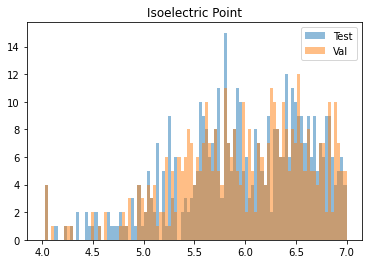

In [46]:
bins = np.linspace(4, 7, 100)

plt.hist(test_paint_df["IsoelectricPoint"], bins, alpha=0.5, label='Test')
plt.hist(val_paint_df["IsoelectricPoint"][:-1], bins, alpha=0.5, label='Val')
plt.legend(loc='upper right')
plt.title("Isoelectric Point")
plt.show()

In [55]:
test_embed_without_ignored = np.array(test_embed_without_ignored)
test_avg = test_embed_without_ignored.mean(axis=1)

In [56]:
val_embed_without_ignored = np.array(val_embed_without_ignored)
val_avg = test_embed_without_ignored.mean(axis=1)

In [53]:
plot_scatter(generated_avg[:, 0:0+3], {"gc": generated_paint_df.GC[:3656]}, "gc")

NameError: name 'generated_avg' is not defined

In [58]:
!pip install plotly

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.2/15.2 MB 80.6 MB/s eta 0:00:00a 0:00:01


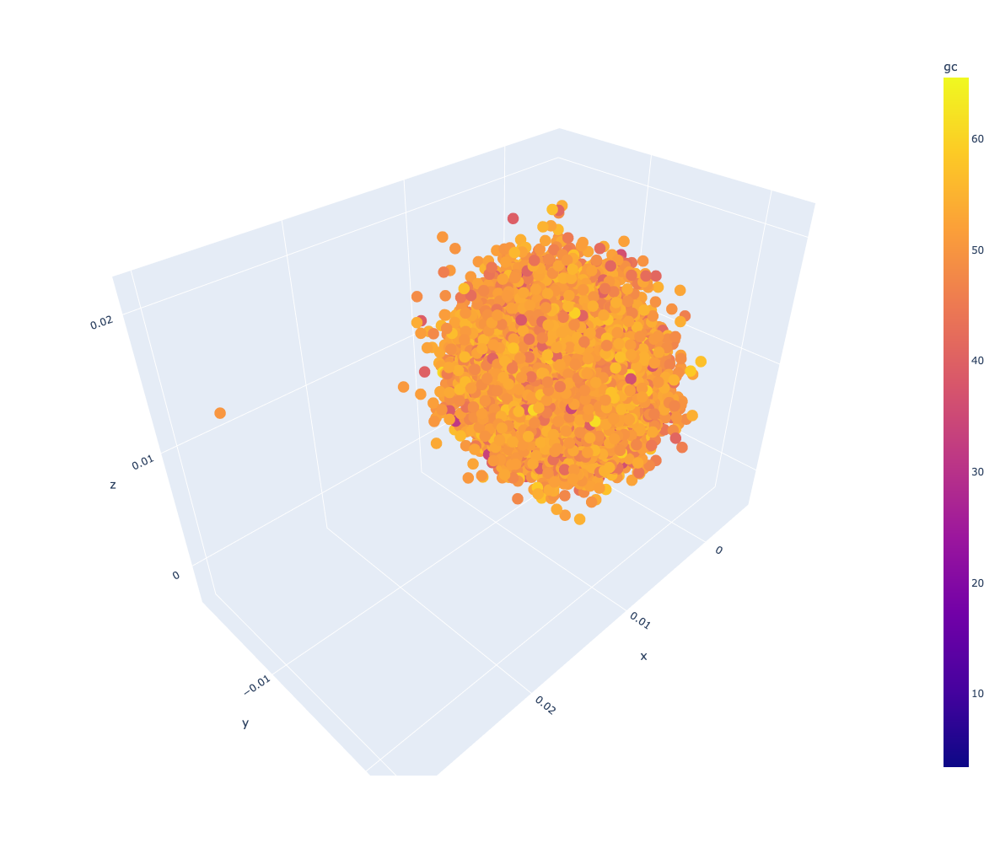

In [59]:
plot_scatter(test_avg[:, 0:0+3], {"gc": test_paint_df.GC}, "gc")

In [67]:
def run_tsne(data: np.ndarray):
        
    # Attempt to use rapidsai
    # from cuml.manifold import TSNE
    from sklearn.manifold import TSNE
    
    # rapidsai only supports 2 dimensions
    model = TSNE(n_components=2, method="barnes_hut")
    
    data_proj = model.fit_transform(data)
    return data_proj
    
def plot_tsne(data_proj: np.ndarray, paint: np.ndarray, paint_name: str, cmap: str = "viridis"):
    df = pd.DataFrame({"z0": data_proj[:, 0], "z1": data_proj[:, 1], paint_name: paint[:data_proj.shape[0]]})
    ax2 = df.plot.scatter(x='z0', y='z1',c=paint_name, colormap=cmap, alpha=0.4)
    plt.show()
    return df
    

In [ ]:
840 / 3, 1050 / 3

In [ ]:
# TODO: Grab two from each cluster and run through alphafold

In [ ]:
generated_tsne = run_tsne(generated_avg)
for key in test_paint_df:
    gen_df = plot_tsne(generated_tsne, generated_paint_df[key], key, cmap="viridis")

# Select cluster prototypes for generated sequences

In [ ]:
from sklearn.cluster import KMeans
# Use 8 clusters as seen in t-SNE
kmeans = KMeans(n_clusters=8, random_state=0).fit(generated_avg)

In [ ]:
gen_df = plot_tsne(generated_tsne, kmeans.labels_, "kmeans cluster", cmap="viridis")

In [ ]:
generated_avg.shape

In [ ]:
kmeans.cluster_centers_.shape

In [ ]:
def get_cluster_prototypes(generated_avg, kmeans, k: int = 2) -> Dict[int, List[int]]:
    results = {}
    inds = np.arange(len(generated_avg))
    for label in np.unique(kmeans.labels_):
        mask = kmeans.labels_ == label
        generated_inds = inds[mask]
        generated_cluster = generated_avg[mask]
        # Recompute cluster center incase of numerical issues
        # Should be the same as kmeans.cluster_centers_[label]
        center = np.mean(generated_cluster, axis=0).reshape(1, -1)
        dists = np.linalg.norm(center - generated_cluster, axis=1)
        top_k = np.argpartition(dists, kth=k)
        results[label] = generated_inds[top_k[:k]]
    return results

In [ ]:
# Pick 2 points in each cluster that are closest to the kmeans cluster centroid
prototypes = get_cluster_prototypes(generated_avg, kmeans)

In [ ]:
prototypes

In [ ]:
prototype_seqs = {key: [generated_protein_seqs[ind] for ind in val]  for key, val in prototypes.items()}

In [ ]:
record_dir = Path("synthetic_seqeunces")
record_dir.mkdir(exist_ok=True)
for key, seqs in prototype_seqs.items():
    inds = prototypes[key]
    for seq, ind in zip(seqs, inds):
        seq.id = f"MDH_SyntheticSeq_cluster_prototype_{key}_index_{ind}"
        seq.name="MDH_sequence",
        seq.description="synthetic malate dehydrogenase"
        SeqIO.write(seq, record_dir / f"MDH_synthetic_cluster_prototype_{key}_index_{ind}.fasta", "fasta")

# Visualization of testing embeddings

In [62]:
!conda install -c rapidsai cuml

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.

ResolvePackageNotFound: 
  - python=3.1



In [66]:
from sklearn.manifold import TSNE

/homes/mzvyagin/anaconda3/envs/gpt/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/homes/mzvyagin/anaconda3/envs/gpt/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



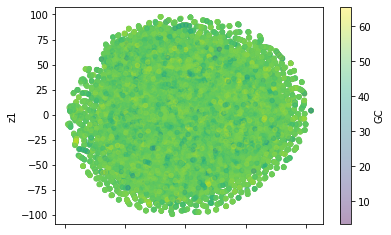

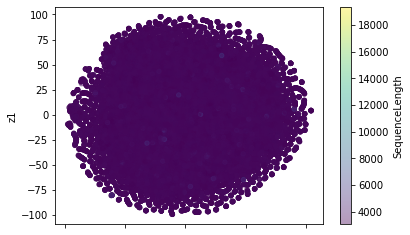

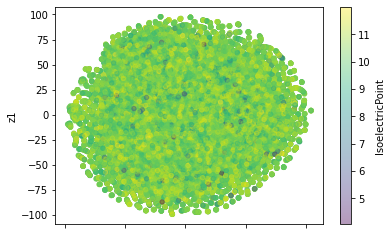

In [68]:
test_tsne = run_tsne(test_avg)
for key in test_paint_df:
    test_df = plot_tsne(test_tsne, test_paint_df[key], key, cmap="viridis")

In [69]:
test_tsne.shape

(37292, 2)

In [70]:
len(test_paint_df)

37292

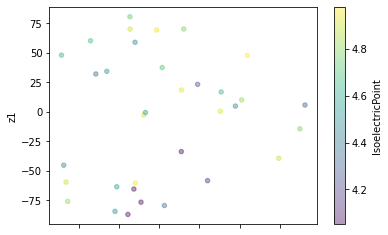

,z0,z1,IsoelectricPoint
1945,23.867151,23.231165,4.237427
2669,-39.283665,32.065266,4.357073
2831,-9.567737,-2.806548,4.941093
4801,-60.570850,48.050404,4.639733
7801,38.443882,16.817202,4.662071
7803,51.200138,10.032597,4.825028
8840,-42.567898,60.231373,4.672586
9009,-57.744843,-59.652718,4.898919
10501,13.725149,-33.770767,4.050028
10502,-15.677749,-65.547203,4.050028


In [71]:
key = "IsoelectricPoint"
iso_slice = (test_paint_df[key] < 5).values
plot_tsne(test_tsne[iso_slice], test_paint_df[key][iso_slice], key, cmap="viridis")

In [ ]:
test_tsne.shape

# Visualization of validation embeddings

/homes/mzvyagin/anaconda3/envs/gpt/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/homes/mzvyagin/anaconda3/envs/gpt/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



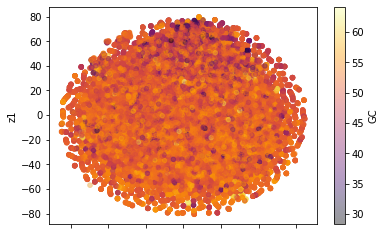

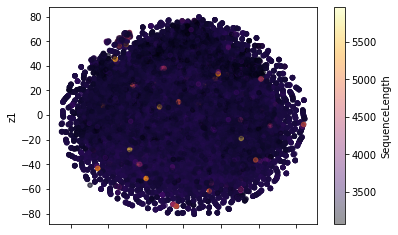

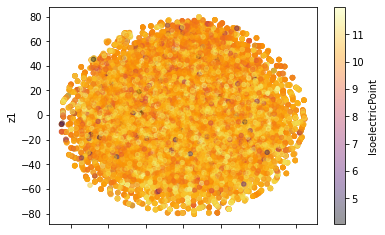

In [72]:
val_tsne = run_tsne(val_avg)
for key in val_paint_df:
    val_df = plot_tsne(val_tsne, val_paint_df[key], key, cmap="inferno")

In [74]:
key = "IsoelectricPoint"
iso_slice = (val_paint_df[key] < 5).values
plot_tsne(val_tsne[iso_slice], val_paint_df[key][iso_slice], key, cmap="viridis")

IndexError: boolean index did not match indexed array along dimension 0; dimension is 37292 but corresponding boolean dimension is 38633

In [75]:
from Bio import pairwise2
from tqdm import tqdm
from concurrent.futures import ProcessPoolExecutor

def compute_alignment_scores(kwargs: dict):
    # Input arguments to parallel function    
    target_seq = kwargs.get("target_seq")
    seqs = kwargs.get("seqs")
    alignment_type = kwargs.get("alignment_type")
    
    if alignment_type == "global":
        aligner = pairwise2.align.globalxx
    elif alignment_type == "local":
        aligner = pairwise2.align.localxx
    else:
        raise ValueError(f"Invalid alignment_type: {alignment_type}")
        
    scores = np.array([
        aligner(target_seq, seq, score_only=True)
        for seq in seqs
    ])
    return scores

def alignment_scores_parallel(
    seqs1: List[SeqRecord.SeqRecord],
    seqs2: List[SeqRecord.SeqRecord],
    alignment_type: str = "global",
    num_workers: int = 1
):
    """Computes all pairwise alignments scores between sequences 
    in seqs1 and seqs2"""
    
    kwargs = [
        {
            "target_seq": seq,
            "seqs": seqs2,
            "alignment_type": alignment_type,
        }
        for seq in seqs1 
    ]
    
    scores_matrix = []
    with ProcessPoolExecutor(max_workers=num_workers) as executor:
        for scores in tqdm(executor.map(compute_alignment_scores, kwargs)):
            scores_matrix.append(scores)
    return np.array(scores_matrix)

In [77]:
test_protein_seq = test_decoded_protein_seqs

In [ ]:
test_alignment_scores = alignment_scores_parallel(test_protein_seq, test_protein_seq, num_workers=70)

18710it [47:30:52, 10.47s/it] 

In [ ]:
test_local_alignment_scores = alignment_scores_parallel(
    test_protein_seq, test_protein_seq, alignment_type="local", num_workers=70
)

In [ ]:
plt.imshow(test_alignment_scores)

In [ ]:
plt.imshow(test_local_alignment_scores)

In [ ]:
from scipy.spatial import distance_matrix

In [ ]:
test_emb_dist = distance_matrix(test_avg, test_avg)

In [ ]:
test_emb_dist.shape

In [ ]:
plt.imshow(test_emb_dist)

In [ ]:
test_emb_dist_upper = np.triu(test_emb_dist).flatten()
test_emb_dist_upper = test_emb_dist_upper[test_emb_dist_upper > 0]

# need to subtract of diagonal since alignment scores between the same seqeunce will be large positive values
test_alignment_scores_upper = np.triu(test_alignment_scores - np.diag(np.diag(test_alignment_scores))).flatten()
test_alignment_scores_upper = test_alignment_scores_upper[test_alignment_scores_upper > 0]

# need to subtract of diagonal since alignment scores between the same seqeunce will be large positive values
# test_local_alignment_scores_upper = np.triu(test_local_alignment_scores - np.diag(np.diag(test_local_alignment_scores))).flatten()
# test_local_alignment_scores_upper = test_local_alignment_scores_upper[test_local_alignment_scores_upper > 0]

print(test_emb_dist_upper.shape)
print(test_alignment_scores_upper.shape)

scores_df = pd.DataFrame({
    "Embedding L2 Distance": test_emb_dist_upper,
    "Global Alignment Score": test_alignment_scores_upper,
    #"Local Alignment Score": test_local_alignment_scores_upper,
})

In [ ]:
unique_scores = scores_df["Global Alignment Score"].unique()

In [ ]:
unique_scores

In [ ]:
scores_df

In [ ]:
score_avg_dist = [
    np.mean(scores_df["Embedding L2 Distance"][scores_df["Global Alignment Score"] == score])
    for score in sorted(unique_scores)
]

score_stdev_dist = [
    np.std(scores_df["Embedding L2 Distance"][scores_df["Global Alignment Score"] == score])
    for score in sorted(unique_scores)
]

In [ ]:
score_avg_df = pd.DataFrame({
    "avg_emb": score_avg_dist,
    "stdev_emb": score_stdev_dist,
    "align_score": sorted(unique_scores)
})

score_avg_df.corr()

In [ ]:
lower_bound = score_avg_df.avg_emb - score_avg_df.stdev_emb
upper_bound = score_avg_df.avg_emb + score_avg_df.stdev_emb
plt.plot(score_avg_df.align_score, score_avg_df.avg_emb, linewidth=3)
plt.ylabel("L2 Embedding Distance", fontsize=14)
plt.xlabel("Global Alignment Score", fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.fill_between(score_avg_df.align_score, lower_bound, upper_bound, alpha=.3)

In [ ]:
scores_df[::100].plot.scatter(y="Embedding L2 Distance", x="Global Alignment Score")

In [ ]:
scores_df[::100].plot.scatter(y="Embedding L2 Distance", x="Local Alignment Score")

In [ ]:
scores_df.corr()